In [76]:
import pickle
import os
import pandas as pd
import networkx as nx
from scipy.sparse import coo_matrix
import numpy as np
from scipy.sparse.linalg import eigs
import seaborn as sns
import matplotlib.pyplot as plt

In [77]:
def compute_similarity(func, runs, lam, th =  100):
    sets = [set(s.nodes) for s in runs['non_zeros_sub_graphs']]
    N = len(sets)
    # Pairwise
    similarity_scores = np.zeros((N, N))
    k = sets
    for i in range(N):
        for j in range(N):
            if i==j:
                continue
            similarity_scores[i][j] = func(sets[i], sets[j])
    mat, v = similarity_scores, sum(sum(similarity_scores))/(N*(N-1))
    return mat, v, v2

In [78]:
dice = lambda s1,s2: 2*len(s1&s2)/(len(s1)+len(s2))
hamming = lambda s1,s2: 1-(len(s1-s2)+len(s2-s1))/rna.shape[1]
jaccard = lambda s1,s2: len(s1&s2)/len(s1|s2)
overlapping = lambda s1,s2: len(s1&s2)/len(s1)
consistency = lambda s1,s2: (len(s1&s2)-len(s1)*len(s2)/rna.shape[1])/(min(len(s1),len(s2))-max(0,len(s1)+len(s2)-rna.shape[1]))
wald = lambda s1,s2: (len(s1&s2)-len(s1)*len(s2)/rna.shape[1])/(min(len(s1),len(s2))-len(s1)*len(s2)/rna.shape[1])
nPOG = lambda s1,s2: (len(s1&s2)-len(s1)*len(s2)/rna.shape[1])/(len(s1)-len(s1)*len(s2)/rna.shape[1])
metrics = [('dice',dice),('hamming',hamming),('jaccard',jaccard),('overlapping',overlapping)
           ,('consistency',consistency),('wald',wald),('nPOG',nPOG)]

# LGG

In [ ]:
source_dir = os.getenv('ROOTCGNET')

In [79]:
rna = pd.read_csv(os.path.join(source_dir, "PathwayCommons12.All.hgnc_subrna.csv", sep=";", index_col  =0)

In [80]:
graph = os.path.join(source_dir, "PathwayCommons12.All.hgnc_laplacian.pkl")
L = pickle.load(open(graph, 'rb'))
L = coo_matrix(L)
A = pd.DataFrame(np.diag(np.diag(L.todense())) - L, columns = rna.columns, index= rna.columns)
g  = nx.from_pandas_adjacency(A)
lambda_r, _ = eigs(L.astype('float'), k = 1)
lambda_r = 1/ lambda_r[0].real
L_normalized = pickle.load(open(os.path.join(source_dir, "PathwayCommons12.All.hgnc_normalized_laplacian.pkl"), "rb"))
L_normalized = coo_matrix(L_normalized)
lambda_n, _ = eigs(L_normalized.astype('float'), k = 1)
lambda_n = 1/ lambda_n[0].real
del(L)
del(A)
del(L_normalized)

In [81]:
with open(os.path.join(source_dir, "runs/results/Results/LGG/LGG_raw.pkl"), 'rb') as f:
    r = pickle.load(f)
with open(os.path.join(source_dir, "runs/results/Results/LGG/LGG_norm.pkl"), 'rb') as f:
    r_normalized = pickle.load(f)

In [82]:
stability = []
for k, v in r_normalized.items():
    for m in metrics:
        tmp = compute_similarity(m[1],v, round(np.log10(k/lambda_n)), th=0)
        stability.append({
                'lambda': round(np.log10(k/lambda_n)),
                'stability_score': tmp[1],
                'stability_all':tmp[0],
                'type' : 'normalized',
                'metric': m[0], 
                'global': tmp[2],
            })

for k, v in r.items():
    for m in metrics:
        tmp = compute_similarity(m[1],v,round(np.log10(k/lambda_r)), th=0)
        stability.append({
                'lambda': round(np.log10(k/lambda_r)),
                'stability_score': tmp[1],
                'stability_all':tmp[0],
                'type' : 'raw',
                'metric': m[0],
                'global' : tmp[2]
            })

In [83]:
stability_df = pd.DataFrame(stability)

Text(0, 0.5, 'stability_score (dice)')

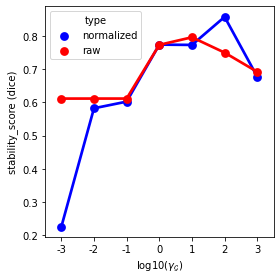

In [86]:
_, ax = plt.subplots(figsize=(4,4))
ax = sns.pointplot(x="lambda", y="stability_score", hue="type",
                   data=stability_df.loc[stability_df['metric']==metrics[0][0],:], palette=['blue','red'], ax=ax)
ax.set_xlabel('log10($\gamma_{\mathcal{G}}$)')
ax.set_ylabel('stability_score (%s)' % metrics[0][0])

Text(0, 0.5, 'stability_score (nPOG)')

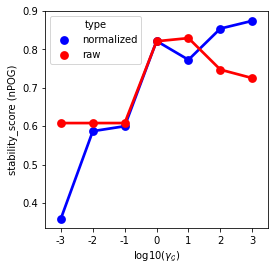

In [10]:
_, ax = plt.subplots(figsize=(4,4))
ax = sns.pointplot(x="lambda", y="stability_score", hue="type",
                   data=stability_df.loc[stability_df['metric']==metrics[6][0],:], palette=['blue','red'], ax=ax)
ax.set_xlabel('log10($\gamma_{\mathcal{G}}$)')
ax.set_ylabel('stability_score (%s)' % metrics[6][0])

In [11]:
import matplotlib.pyplot as plt

Text(0.5, 0, 'log10($\\gamma_{\\mathcal{G}}$)')

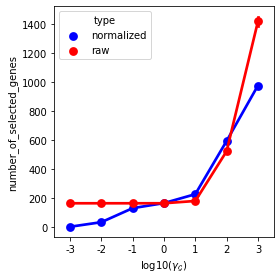

In [73]:
distribution = []
for k, v in r_normalized.items():
    graphss =  v['non_zeros_sub_graphs']
    for ggs in graphss:
        distribution.append({
            'lambda': round(np.log10(k/lambda_n)),
            'number_of_selected_genes': len(ggs.nodes),
            'type' : 'normalized'
        })
for k, v in r.items():
    graphss =  v['non_zeros_sub_graphs']
    for ggs in graphss:
        distribution.append({
            'lambda': round(np.log10(k/lambda_r)),
            'number_of_selected_genes': len(ggs.nodes),
            'type' : 'raw'
        })
distribution = pd.DataFrame(distribution)
fig, ax = plt.subplots(figsize=(4,4))
ax = sns.pointplot(x="lambda", y="number_of_selected_genes", hue="type", data=distribution,  palette=['blue','red'], ax=ax)
ax.set_xlabel('log10($\gamma_{\mathcal{G}}$)')

### Compare the stability of variable selection

In [8]:
l = 3
selected_lambda_raw = list(r.keys())[l+3]
selected_lambda_normalized = list(r_normalized.keys())[l+3]

NameError: name 'M2' is not defined

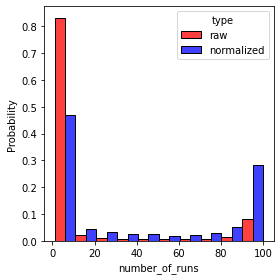

In [76]:
summary_complete = r[selected_lambda_raw]['summary']
summary_complete['type'] = 'raw'
summary_normalized = r_normalized[selected_lambda_normalized]['summary']
summary_normalized['type'] = 'normalized'

results3 = pd.concat([summary_complete, summary_normalized])
results3 = results3.reset_index()
_, ax = plt.subplots(figsize=(4,4))
ax = sns.histplot(data=results3[results3['number_of_folds'] > 0], x="number_of_folds", stat='probability', common_norm=False, hue="type", multiple="dodge", label = False, palette=['red','blue'], bins=10, ax=ax)
ax.set_xlabel('number_of_runs')

## Compare degree distribution of selected gene in full graph the subgraph

In [9]:
graphs = r[selected_lambda_raw]['non_zeros_sub_graphs'][10]
degree_sequence = sorted((g.degree(n) for n, d in graphs.degree()), reverse=True)
dff = [{'degree': np.floor(np.log(x+1)/np.log(2)), 'fold': 0} for x in degree_sequence]
for i in range(5):
    graphs = r[selected_lambda_raw]['non_zeros_sub_graphs'][i]
    degree_sequence = sorted((g.degree(n) for n, d in graphs.degree()), reverse=True)
    dff.extend([{'degree': np.floor(np.log(x+1)/np.log(2)) if x > 0 else 0, 'fold': i} for x in degree_sequence])
dff = pd.DataFrame(dff)

In [10]:
graphs = r_normalized[selected_lambda_normalized]['non_zeros_sub_graphs'][10]
degree_sequence = sorted((g.degree(n) for n, d in graphs.degree()), reverse=True)
dff2 = [{'degree': np.floor(np.log(x+1)/np.log(2)), 'fold': 0} for x in degree_sequence]
for i in range(5):
    graphs = r_normalized[selected_lambda_normalized]['non_zeros_sub_graphs'][i]
    degree_sequence = sorted((g.degree(n) for n, d in graphs.degree()), reverse=True)
    dff2.extend([{'degree': np.floor(np.log(x+1)/np.log(2)), 'fold': i} for x in degree_sequence])
dff2 = pd.DataFrame(dff2)

In [11]:
degrees_test = pd.DataFrame(g.degree, columns = ['gene', 'degree'])
degrees_test['degree2'] = degrees_test['degree'].apply(lambda x: np.floor(np.log(x+1)/np.log(2)))

In [12]:
dff['degree2'] = dff['degree'].apply(lambda x: str(int(x)))
dff2['degree2'] = dff2['degree'].apply(lambda x: str(int(x)))
degrees_test['degree3'] = degrees_test['degree2'].apply(lambda x: str(int(x)))

In [13]:
dff['fold2'] = dff['fold']
dff2['fold2'] = dff2['fold']
dff['run'] = dff['fold2'].apply(lambda x: 'run_' + str(x))
dff2['run'] = dff2['fold2'].apply(lambda x: 'run_' + str(x))

/volatile/Workspace/myenv/lib/python3.8/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.2 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/volatile/Workspace/myenv/lib/python3.8/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.2 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


Text(0.5, 0, 'log2(degree)')

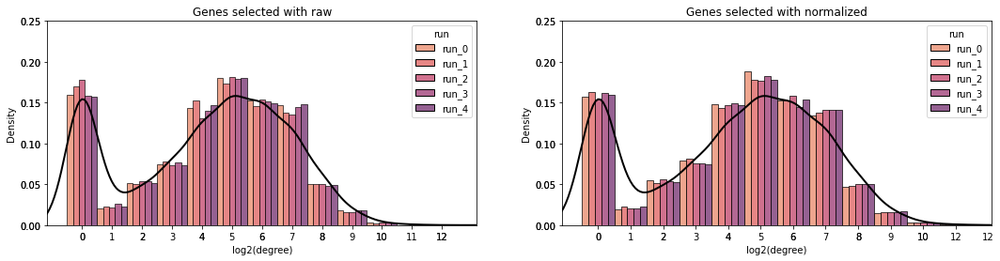

In [15]:
palette = sns.color_palette('flare', as_cmap=True)
fig, axs = plt.subplots(1,2, figsize=(18,4))
sns.histplot(data=dff.sort_values(by='degree'), x="degree2", hue="run", legend = True, ax=axs[0], common_norm=False,
    stat='density', multiple='dodge', palette='flare', hue_order=['run_0','run_1','run_2','run_3','run_4'])
axs[0].set_title('Genes selected with raw')
sns.histplot(data=dff2.sort_values(by='degree'), x="degree2", hue="run", legend = True, ax=axs[1],common_norm=False, stat='density'
             , multiple='dodge', palette='flare', hue_order=['run_0','run_1','run_2','run_3','run_4'])
axs[1].set_title('Genes selected with normalized')
#
nax = fig.add_axes(axs[0].get_position(), frameon=False)
sns.kdeplot( ax=nax, data=degrees_test.sort_values(by='degree2'), x="degree2", legend=False, bw=0.2, linewidth=2, color='black')
nax.set_xlim(axs[0].get_xlim())
nax.set_ylim((0,0.25))
axs[0].set_ylim((0,0.25))
nax.tick_params(left=False, bottom=False)
nax.set_ylabel('')
nax.set_xlabel('')

nax = fig.add_axes(axs[1].get_position(), frameon=False)
sns.kdeplot( ax=nax, data=degrees_test.sort_values(by='degree2'), x="degree2", legend=False, bw=0.2, linewidth=2, color='black')
nax.set_xlim(axs[1].get_xlim())
nax.set_ylim((0,0.25))
axs[1].set_ylim((0,0.25))
nax.tick_params(left=False, bottom=False)
nax.set_ylabel('')
nax.set_xlabel('')


#axs[0].plot(axs[2].get_lines())
#axs[2].set_title('All genes')
axs[0].set_xlabel('log2(degree)')
axs[1].set_xlabel('log2(degree)')
#axs[2].set_xlabel('log2(degree)')

In [16]:
graphs = r[selected_lambda_raw]['non_zeros_sub_graphs'][10]
degree_sequence = sorted((d for n, d in graphs.degree()), reverse=True)
dff = [{'degree': np.floor(np.log(x+1)/np.log(2)), 'fold': 0} for x in degree_sequence]
for i in range(5):
    graphs = r[selected_lambda_raw]['non_zeros_sub_graphs'][i]
    degree_sequence = sorted((d for n, d in graphs.degree()), reverse=True)
    dff.extend([{'degree': np.floor(np.log(x+1)/np.log(2)), 'fold': i} for x in degree_sequence])
dff = pd.DataFrame(dff)

In [18]:
graphs = r_normalized[selected_lambda_normalized]['non_zeros_sub_graphs'][10]
degree_sequence = sorted((d for n, d in graphs.degree()), reverse=True)
dff2 = [{'degree': np.floor(np.log(x+1)/np.log(2)), 'fold': 0} for x in degree_sequence]
for i in range(5):
    graphs = r_normalized[selected_lambda_normalized]['non_zeros_sub_graphs'][i]
    degree_sequence = sorted((d for n, d in graphs.degree()), reverse=True)
    dff2.extend([{'degree': np.floor(np.log(x+1)/np.log(2)), 'fold': i} for x in degree_sequence])
dff2 = pd.DataFrame(dff2)

In [19]:
dff['degree2'] = dff['degree'].apply(lambda x: str(int(x)))
dff2['degree2'] = dff2['degree'].apply(lambda x: str(int(x)))

In [20]:
dff['run'] = dff['fold'].apply(lambda x: 'run_' + str(x))
dff2['run'] = dff2['fold'].apply(lambda x: 'run_' + str(x))

(0.0, 0.4)

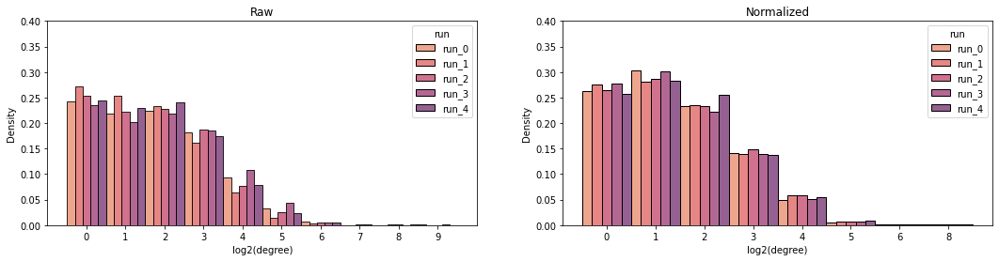

In [22]:
_, axs = plt.subplots(1,2, figsize=(18,4))
sns.histplot(data=dff.sort_values(by='degree'), x="degree2", hue="run", legend = True, ax=axs[0], stat='density'
             , multiple='dodge', palette='flare', hue_order=['run_0','run_1','run_2','run_3','run_4'], common_norm=False)
axs[0].set_title('Raw')
sns.histplot(data=dff2.sort_values(by='degree'), x="degree2", hue="run", legend = True, ax=axs[1], stat='density'
             , multiple='dodge', palette='flare', hue_order=['run_0','run_1','run_2','run_3','run_4'], common_norm=False)
axs[1].set_title('Normalized')
axs[0].set_xlabel('log2(degree)')
axs[1].set_xlabel('log2(degree)')
axs[0].set_ylim((0,0.4))
axs[1].set_ylim((0,0.4))

### Compare weight distribution and grouping effects

In [26]:
def extract_weights(r_, l):
    W =r_[l]['weights']
    R = {}
    ll = []
    for i in range(10):
        gg= r_[l]['non_zeros_sub_graphs'][i]
        length = dict(nx.all_pairs_dijkstra_path_length(gg))
        length = pd.DataFrame(length)
        ww = W.loc[i, list(gg.nodes)]
        for n1 in range(len(length.columns)-1):
            for n2 in range(n1+1, len(length.columns)):
                gene1, gene2 =length.columns[n1], length.columns[n2]
                d= pd.DataFrame(length).loc[gene1, gene2]
                if(pd.isna(d) or d > 5): continue
                ll.append({'length': d, 'dist': np.abs(ww[gene1] - ww[gene2]), 'fold': i, 'contrib': ww[gene1] *  ww[gene2] > 0, 'sign' : ww[gene1] > 0})
    return pd.DataFrame(ll)

In [70]:
def extract_weights_abs(r_, l):
    W =r_[l]['weights']
    R = {}
    ll = []
    for i in range(10):
        gg= r_[l]['non_zeros_sub_graphs'][i]
        length = dict(nx.all_pairs_dijkstra_path_length(gg))
        length = pd.DataFrame(length)
        ww = W.loc[i, list(gg.nodes)]
        for n1 in range(len(length.columns)-1):
            for n2 in range(n1+1, len(length.columns)):
                gene1, gene2 =length.columns[n1], length.columns[n2]
                d= pd.DataFrame(length).loc[gene1, gene2]
                if(pd.isna(d) or d > 5): continue
                ll.append({'length': d, 'dist': np.abs(np.abs(ww[gene1]) - np.abs(ww[gene2])), 'fold': i})
    return pd.DataFrame(ll)

In [27]:
def extract_weights2(r_, l):
    W =r_[l]['weights']
    R = {}
    ll = []
    for i in range(10):
        gg= r_[l]['non_zeros_sub_graphs'][i]
        #length = dict(nx.all_pairs_dijkstra_path_length(gg))
        #length = pd.DataFrame(length)
        ww = W.loc[i, list(gg.nodes)]
        for n1 in gg.nodes():
            d= g.degree(n1)
            w = ww[n1]
            ll.append({'degree': d, 'weight': w, 'fold': i})
    return pd.DataFrame(ll)

In [28]:
D_weights_diff_normalized = extract_weights(r_normalized, selected_lambda_normalized)
D_weights_diff_raw = extract_weights(r, selected_lambda_raw)

In [34]:
D_weights_normalized = extract_weights2(r_normalized, selected_lambda_normalized)
D_weights_normalized['type'] = 'normalized'
D_weights_raw = extract_weights2(r, selected_lambda_raw)
D_weights_raw['type'] = 'raw'
D_weights = pd.concat([D_weights_raw, D_weights_normalized])
D_weights['log2degree'] = D_weights['degree'].apply(lambda x: np.floor(np.log(x+1)/ np.log(2)))
D_weights = D_weights[D_weights['log2degree']>0]
D_weights['sign'] = D_weights['weight'].apply(lambda x: x>0)

Text(0.5, 1.0, 'Normalized')

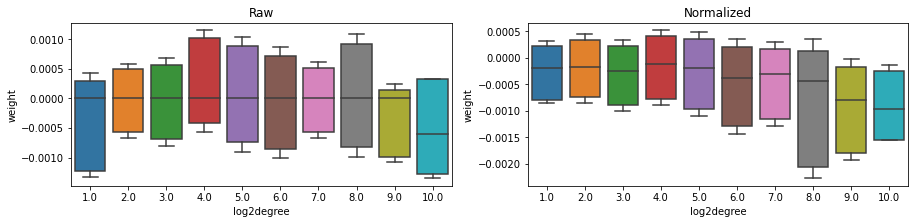

In [63]:
fig, axs = plt.subplots(1,2, figsize=(15,3))
D_weights2= D_weights[D_weights['log2degree']< 11]
sns.boxplot(x="log2degree", y="weight", data=D_weights2[D_weights2['type'] == 'raw'],  showfliers = False, ax= axs[0], whis=0.1)
sns.boxplot(x="log2degree", y="weight", data=D_weights2[D_weights2['type'] == 'normalized'],  showfliers = False, ax= axs[1], whis=0.1)
axs[0].set_title('Raw')
axs[1].set_title('Normalized')

In [36]:
grouped_raw = D_weights_diff_raw.groupby(['length', 'fold'])
grouped_raw = grouped_raw.apply(lambda x: x.sample(frac=0.2))
grouped_raw['type'] = 'raw'
grouped_normalized = D_weights_diff_normalized.groupby(['length', 'fold'])
grouped_normalized = grouped_normalized.apply(lambda x: x.sample(frac=0.2))
grouped_normalized['type'] = 'normalized'

grouped_mean = pd.concat([grouped_raw, grouped_normalized])

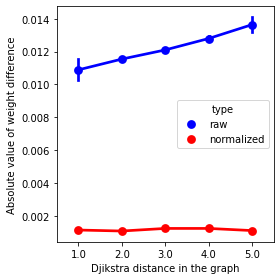

In [73]:
grouped_mean = pd.concat([grouped_raw, grouped_normalized])
fig, axs = plt.subplots(1,1, figsize=(4,4))
sns.pointplot(x="length", y="dist", data = grouped_mean, ax= axs, palette=['blue', 'red'], hue="type")

axs.set_xlabel('Djikstra distance in the graph')
axs.set_ylabel('Absolute value of weight difference')
fig.tight_layout()

## Comparison between PC, KEGG and MSigDB

In [6]:
with open(os.path.join(source_dir,"runs/results/Results/LGG/LGG_kegg.pkl"), 'rb') as f:
    r_kegg = pickle.load(f)
with open(os.path.join(source_dir,"runs/results/Results/LGG/LGG_msigdb.pkl"), 'rb') as f:
    r_msigdb = pickle.load(f)

In [7]:
selected_lambda_kegg = list(r_kegg.keys())[l+3]
selected_lambda_msig = list(r_msigdb.keys())[l+3]

In [8]:
r_kegg = r_kegg[selected_lambda_kegg]
r_msigdb = r_msigdb[selected_lambda_msig]

In [16]:
permuted_inter = []
R_subgraphs= []
for i in range(100):
    for res in [('kegg',r_kegg),('msigdb',r_msigdb)]:
        dd = {}
        dd['run'] = i
        init_select = r_normalized[selected_lambda_normalized]['weights'].columns[(r_normalized[selected_lambda_normalized]['weights'].iloc[i] !=0)]
        permuted_select = res[1]['weights'].columns[res[1]['weights'].iloc[i] !=0]
        dd["size_init"] = len(init_select)
        dd["size_permuted"] = len(permuted_select)
        dd["size_intersection"] = len(set(init_select).intersection(set(permuted_select)))
        dd["size_union"] = len(set(init_select).union(set(permuted_select)))
        dd['Consistency'] = nPOG(set(init_select),set(permuted_select))
        dd["Dice"] = 2 * len(set(init_select).intersection(set(permuted_select))) / (len(init_select) + len(permuted_select))
        dd['type'] = res[0]
        dd['source'] = 'PC'
        R_subgraphs.append(dd)
for i in range(100):
    dd = {}
    dd['run'] = i
    init_select = r_msigdb['weights'].columns[(r_msigdb['weights'].iloc[i] !=0)]
    permuted_select = r_kegg['weights'].columns[r_kegg['weights'].iloc[i] !=0]
    dd["size_init"] = len(init_select)
    dd["size_permuted"] = len(permuted_select)
    dd["size_intersection"] = len(set(init_select).intersection(set(permuted_select)))
    dd["size_union"] = len(set(init_select).union(set(permuted_select)))
    dd['Consistency'] = nPOG(set(init_select),set(permuted_select))
    dd["Dice"] = 2 * len(set(init_select).intersection(set(permuted_select))) / (len(init_select) + len(permuted_select))
    dd['type'] = 'kegg'
    dd['source'] = 'msigdb'
    R_subgraphs.append(dd)

In [17]:
R_subgraphs = pd.DataFrame(R_subgraphs)
R_subgraphs['overlap'] = R_subgraphs['size_intersection']/R_subgraphs['size_permuted'] 
R_subgraphs.groupby(['type', 'source']).agg(['mean','std'])

run            size_init            size_permuted             \
               mean        std      mean        std          mean        std   
type   source                                                                  
kegg   PC      49.5  29.011492    975.37  66.566994        233.78  30.766498   
       msigdb  49.5  29.011492    434.51  14.994608        233.78  30.766498   
msigdb PC      49.5  29.011492    975.37  66.566994        434.51  14.994608   

              size_intersection            size_union             Consistency  \
                           mean        std       mean         std        mean   
type   source                                                                   
kegg   PC                197.24  64.615587    1011.91  117.229818    0.196422   
       msigdb            194.40  67.149614     473.89   57.577159    0.438221   
msigdb PC                428.33  38.038273     981.55   82.603272    0.429783   

                             Dice             overlap            
                    std      mean       std      mean       std  
type   source                                                    
kegg   PC      0.070620  0.330060  0.107138  0.845038  0.248315  
       msigdb  0.153383  0.578060  0.188415  0.833093  0.263562  
msigdb PC      0.056066  0.609509  0.065116  0.984388  0.068973

In [98]:
th = 80
s1 = set(r_kegg['summary'][r_kegg['summary']['number_of_folds']>th].index)
s2 = set(r_msigdb['summary'][r_msigdb['summary']['number_of_folds']>th].index)
s3 = set(r_normalized[selected_lambda_normalized]['summary'][r_normalized[selected_lambda_normalized]['summary']['number_of_folds']>th].index)

Text(0, 0.3, '122')

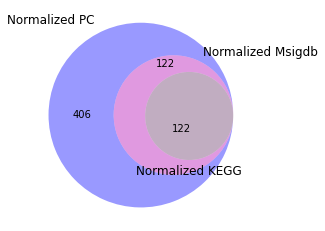

In [100]:
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
from matplotlib_venn import venn3, venn3_circles
_, ax = plt.subplots(figsize=(4,4))

out = venn3([s3, s2, s1], ax=ax,
      set_labels = ('Normalized PC', 'Normalized Msigdb', 'Normalized KEGG'), set_colors=['blue','red','green'])
out.subset_labels[6].set_visible(False)
out.subset_labels[2].set_visible(False)

ax.text(0.1,-0.1, '122')
ax.text(0,0.3, '122')

## Removing inner, outer, all links

In [18]:
file_name=os.path.join(source_dir, "runs/Results/LGG/LGG_removed1.pkl")
with open(file_name, 'rb') as f:
    removed = pickle.load(f)

In [10]:
len_sub = []
len_diff = []
len_all = []
for i in range(100):
    run_selected = r_normalized[selected_lambda_normalized]['weights'].columns[(r_normalized[selected_lambda_normalized]['weights'].iloc[i] !=0)]

    edges_all = g.edges(run_selected)
    edges_sub = g.subgraph(run_selected).edges
    edges_diff = set(edges_all) - set(edges_sub)
    len_sub.append(edges_sub)
    len_diff.append(edges_diff)
    len_all.append(edges_all)

In [46]:
R_removed= []
for i in range(100):
    for ename in ['all','sub','diff']:
        dd = {}
        dd['run'] = i
        init_select = r_normalized[selected_lambda_normalized]['weights'].columns[(r_normalized[selected_lambda_normalized]['weights'].iloc[i] !=0)]
        removed_select = rna.columns[removed[str(i) +"_"+ename][0][2].flatten() != 0]
        dd["size_init"] = len(init_select)
        dd["size_removed"] = len(removed_select)
        dd["size_intersection"] = len(set(init_select).intersection(set(removed_select)))
        dd["size_union"] = len(set(init_select).union(set(removed_select)))
        dd["Dice"] = 2 * len(set(init_select).intersection(set(removed_select))) / (len(init_select) + len(removed_select))
        dd['type'] = ename
        R_removed.append(dd)

In [47]:
pd.DataFrame(R_removed).groupby('type').agg(['mean', 'std'])

run            size_init            size_removed             \
      mean        std      mean        std         mean        std   
type                                                                 
all   49.5  29.011492    975.37  66.566994       168.96  17.286019   
diff  49.5  29.011492    975.37  66.566994       426.19  59.309783   
sub   49.5  29.011492    975.37  66.566994       936.00  74.170429   

     size_intersection             size_union                  Dice            
                  mean         std       mean         std      mean       std  
type                                                                           
all             165.89    8.007440     978.44   73.884338  0.291138  0.023511  
diff            426.19   59.309783     975.37   66.566994  0.605954  0.030194  
sub             925.23  111.518251     986.14  119.536311  0.968504  0.089851

### permutation

In [4]:
file_name=os.path.join(source_dir, "runs/Results/LGG/LGG_permuted3.pkl")
with open(file_name, 'rb') as f:
    permuted = pickle.load(f)

In [23]:
R_permuted= []
for i in range(100):
    for per in range(10):
        dd = {}
        dd['run'] = i
        init_select = r_normalized[selected_lambda_normalized]['weights'].columns[(r_normalized[selected_lambda_normalized]['weights'].iloc[i] !=0)]
        permuted_select = permuted[per]['weights'].columns[permuted3[per]['weights'].iloc[i] !=0]
        dd["size_init"] = len(init_select)
        dd["size_permuted"] = len(permuted_select)
        dd["size_intersection"] = len(set(init_select).intersection(set(permuted_select)))
        dd["size_intersection_list"] = set(init_select).intersection(set(permuted_select))
        dd["size_union"] = len(set(init_select).union(set(permuted_select)))
        dd['Consistency'] = consistency(set(init_select),set(permuted_select))
        dd["Dice"] = 2 * len(set(init_select).intersection(set(permuted_select))) / (len(init_select) + len(permuted_select))
        dd['type'] = per
        R_permuted.append(dd)

In [24]:
R_permuted = pd.DataFrame(R_permuted)

In [25]:
R_permuted.groupby('type').agg(['mean', 'std'])

run            size_init            size_permuted             \
      mean        std      mean        std          mean        std   
type                                                                  
0     49.5  29.011492    975.37  66.566994        760.27  27.445025   
1     49.5  29.011492    975.37  66.566994        848.94  15.896013   
2     49.5  29.011492    975.37  66.566994        745.36  26.729290   
3     49.5  29.011492    975.37  66.566994        809.02  30.094457   
4     49.5  29.011492    975.37  66.566994        826.02  55.755958   
5     49.5  29.011492    975.37  66.566994        738.57  40.854325   
6     49.5  29.011492    975.37  66.566994        790.37  40.482608   
7     49.5  29.011492    975.37  66.566994        812.29  27.238674   
8     49.5  29.011492    975.37  66.566994        705.63  18.420813   
9     49.5  29.011492    975.37  66.566994        789.86  45.877311   

     size_intersection           size_union             Consistency            \
                  mean       std       mean         std        mean       std   
type                                                                            
0                37.64  5.115870    1698.00   44.868607    0.000198  0.005648   
1                43.53  4.370366    1780.78   65.048790    0.001722  0.004018   
2                28.74  5.271651    1691.99   81.871480   -0.011089  0.004753   
3                37.04  3.484221    1747.35   48.728764   -0.003668  0.003319   
4                37.77  3.651083    1763.62   34.245041   -0.003444  0.004471   
5                41.10  3.468473    1672.84  103.656846    0.006212  0.007202   
6                36.77  3.831963    1728.97   42.833824   -0.002827  0.004273   
7                40.47  4.319219    1747.19   52.250310    0.000381  0.003851   
8                29.34  5.857258    1651.66   70.440206   -0.008059  0.005214   
9                39.76  3.530874    1725.47   61.863071    0.000815  0.003588   

          Dice            
          mean       std  
type                      
0     0.043278  0.004826  
1     0.047679  0.003892  
2     0.033271  0.004866  
3     0.041477  0.003245  
4     0.041915  0.003733  
5     0.048099  0.004532  
6     0.041618  0.003845  
7     0.045209  0.003768  
8     0.034722  0.005461  
9     0.045029  0.003359

Text(0.5, 0, 'Permutation id')

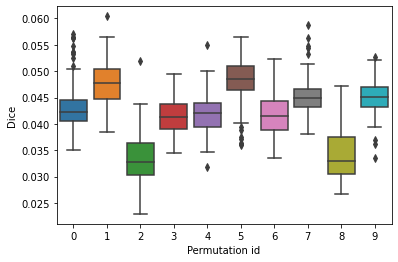

In [30]:
ax = sns.boxplot(data=R_permuted, x="type", y="Dice")
ax.set_xlabel('Permutation id')

### Links removed: randomly

In [65]:
file_name=os.path.join(source_dir, "runs/Results/LGG/LGG_removed3.pkl")
with open(file_name, 'rb') as f:
    removed3 = pickle.load(f)

In [66]:
failed = []
R_removed3= []
for i in range(100):
    for p in np.linspace(0,1,10):
        if removed3[i][p]=='FAILED':
            failed.append([i,p])
            continue
        dd = {}
        dd['run'] = i
        init_select = r_normalized[selected_lambda_normalized]['weights'].columns[(r_normalized[selected_lambda_normalized]['weights'].iloc[i] !=0)]
        removed_select = rna.columns[removed3[i][p]['res'][0][2].flatten() != 0]
        dd["size_init"] = len(init_select)
        dd["size_permuted"] = len(removed_select)
        dd["size_intersection"] = len(set(init_select).intersection(set(removed_select)))
        dd["size_intersection_list"] = set(init_select).intersection(set(removed_select))
        dd["size_union"] = len(set(init_select).union(set(removed_select)))
        dd['Consistency'] = consistency(set(init_select),set(removed_select))
        dd["Dice"] = 2 * len(set(init_select).intersection(set(removed_select))) / (len(init_select) + len(removed_select))
        dd['type'] = p
        R_removed3.append(dd)

In [67]:
R_removed3=pd.DataFrame(R_removed3)
R_removed3.groupby('type').agg(['mean', 'std', 'count'])

run                    size_init                   \
               mean        std count        mean        std count   
type                                                                
0.000000  49.500000  29.011492   100  975.370000  66.566994   100   
0.111111  49.500000  29.011492   100  975.370000  66.566994   100   
0.222222  49.500000  29.011492   100  975.370000  66.566994   100   
0.333333  49.500000  29.011492   100  975.370000  66.566994   100   
0.444444  49.500000  29.011492   100  975.370000  66.566994   100   
0.555556  49.500000  29.011492   100  975.370000  66.566994   100   
0.666667  49.500000  29.011492   100  975.370000  66.566994   100   
0.777778  49.500000  29.011492   100  975.370000  66.566994   100   
0.888889  49.040404  28.790914    99  975.646465  66.848033    99   

         size_permuted                  size_intersection  ...        \
                  mean        std count              mean  ... count   
type                                                       ...         
0.000000    975.370000  66.566994   100        975.370000  ...   100   
0.111111    963.030000  61.809982   100        946.090000  ...   100   
0.222222    944.290000  60.700506   100        943.250000  ...   100   
0.333333    921.500000  57.853437   100        918.650000  ...   100   
0.444444    880.900000  49.413632   100        869.450000  ...   100   
0.555556    830.580000  49.490164   100        825.100000  ...   100   
0.666667    764.940000  45.948548   100        756.350000  ...   100   
0.777778    663.820000  39.475956   100        657.050000  ...   100   
0.888889    504.131313  32.609516    99        496.363636  ...    99   

          size_union                   Consistency                      Dice  \
                mean         std count        mean       std count      mean   
type                                                                           
0.000000  975.370000   66.566994   100    0.950449  0.003382   100  1.000000   
0.111111  992.310000  142.083678   100    0.934932  0.107000   100  0.977712   
0.222222  976.410000   66.336165   100    0.949332  0.004718   100  0.982822   
0.333333  978.220000   68.128752   100    0.947781  0.014007   100  0.968797   
0.444444  986.820000  119.607893   100    0.938945  0.077194   100  0.938779   
0.555556  980.850000   94.905841   100    0.944930  0.055237   100  0.914900   
0.666667  983.960000  101.267415   100    0.940327  0.069800   100  0.870577   
0.777778  982.140000   91.897618   100    0.941133  0.064707   100  0.802851   
0.888889  983.414141   89.495640    99    0.936105  0.071585    99  0.672163   

                          
               std count  
type                      
0.000000  0.000000   100  
0.111111  0.106905   100  
0.222222  0.008101   100  
0.333333  0.015227   100  
0.444444  0.074752   100  
0.555556  0.051379   100  
0.666667  0.063703   100  
0.777778  0.055547   100  
0.888889  0.054633    99  

[9 rows x 21 columns]

Text(0, 0.5, 'Number of selected genes')

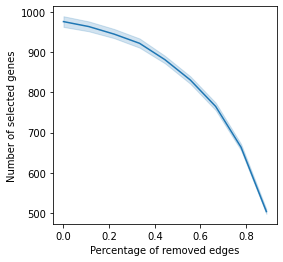

In [70]:
fig, ax = plt.subplots(figsize=(4,4))
ax = sns.lineplot(data=R_removed3, x="type",y="size_permuted", ax=ax)
ax.set_xlabel('Percentage of removed edges')
ax.set_ylabel('Number of selected genes')

In [3]:
corr = corr.stack().reset_index()
corr.columns = ['Row','Column','Value']

NameError: name 'corr' is not defined

In [5]:
corr3 = corr.values.flatten()
corr3 = corr3[~np.isnan(corr3)]
del(corr)
print(corr3.shape)
#

(193739770,)


In [ ]:
sns.histplot(corr3)  

In [ ]:
print(10)

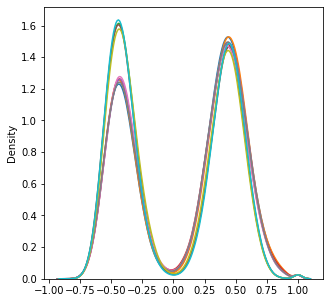

In [9]:
corrs = []
_, axs = plt.subplots(1, 1, figsize=(5,5))
for i in range(10):
    init_select = r_normalized['weights'].columns[(r_normalized['weights'].iloc[i] !=0)]
    corr_x = corr.loc[init_select, init_select]
    sns.kdeplot(corr_x.values.flatten(), ax=axs, color = sns.color_palette("tab10")[i])  

<AxesSubplot:ylabel='Density'>

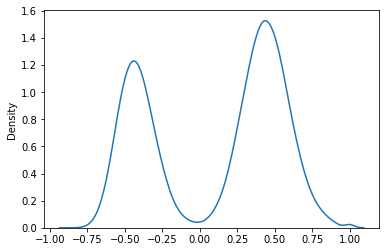

In [13]:
sns.kdeplot(corr_x.values.flatten())


In [17]:
th = 90
dices = []
for i in range(10):
    s2 = set(permuted3[i]['summary'][permuted3[i]['summary']['number_of_folds']>th].index)
    s3 = set(r_normalized[selected_lambda_normalized]['summary'][r_normalized[selected_lambda_normalized]['summary']['number_of_folds']>th].index)
    dices.append(2* len(s2.intersection(s3))/(len(s2) + len(s3)))

In [22]:
r_kegg

{6.228583880960988e-06: {'scores': [0.6958249335026182,
   0.7185031476637107,
   0.6718676811288,
   0.6548796271203553,
   0.631012716515776,
   0.6789982575579429,
   0.7022422911004129,
   0.7120963437152026,
   0.6828254597192072,
   0.6572443283961764,
   0.6943278166126868,
   0.672519656402846,
   0.7018900331817105,
   0.6974270856983523,
   0.6992154337490187,
   0.678362512235849,
   0.6794298976978237,
   0.6974270856983523,
   0.8263247798732327,
   0.6749669502144654,
   0.7018900331817105,
   0.6974270856983523,
   0.6903714463362788,
   0.6883557926645401,
   0.6852565235788747,
   0.7113929663554034,
   0.6769826038862041,
   0.6883557926645401,
   0.7064983787321644,
   0.6668601553423694,
   0.6749669502144654,
   0.7109613262155225,
   0.6787616924718258,
   0.7129769798872613,
   0.6867555491807302,
   0.6917513546859236,
   0.6381797549336725,
   0.6914651126131385,
   0.6953971739724761,
   0.7109613262155225,
   0.6780058899794416,
   0.6546678664694131,
   0.66

In [87]:
cnvs = [r_kegg['full_weights'][i][2] for i in range(100)]

In [88]:
CNV = np.concatenate(cnvs, axis = 1)

In [89]:
np.sum((CNV != 0).sum(axis = 1) > 80)

159

In [125]:
ww= r_normalized[selected_lambda_normalized]["weights"]
g_list = list(ww.columns[(ww!=0).sum(axis=0) > 80])

In [90]:
import gseapy as gs

/volatile/Workspace/myenv/lib/python3.8/site-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.8) or chardet (5.0.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


In [126]:
enrichr = gs.enrichr(g_list, 'MSigDB_Oncogenic_Signatures')

2023-04-18 08:20:47,790 Warning: No enrich terms using library MSigDB_Oncogenic_Signatures when cutoff = 0.05


In [127]:
e = enrichr.results[enrichr.results['P-value']  < 0.05].sort_values('Adjusted P-value')

In [132]:
from statsmodels.stats.multitest import multipletests 
e['Corrected'] = multipletests(e['P-value'], alpha=0.05, method="fdr_by", is_sorted=True)[1]
e

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Corrected
0,MSigDB_Oncogenic_Signatures,RAF UP.V1 DN,16/194,0.001335,0.239925,0,0,2.516722,16.658023,VAV3;TGFB2;ARL3;IGFBP2;SLC1A1;ARMC9;ZNF32;DNAJ...,0.033199
1,MSigDB_Oncogenic_Signatures,CAHOY ASTROGLIAL,10/100,0.002608,0.239925,0,0,3.098049,18.430961,ANXA1;PSRC1;ATOH8;SERPING1;COL8A1;MSN;TIMP1;EM...,0.033199
2,MSigDB_Oncogenic_Signatures,TGFB UP.V1 DN,13/192,0.017680,0.854868,0,0,2.024415,8.169204,VAV3;RASL10A;EYA4;FNDC3B;RAB33A;GNAI1;SMAD7;MI...,0.139655
3,MSigDB_Oncogenic_Signatures,KRAS.KIDNEY UP.V1 UP,10/145,0.031190,0.854868,0,0,2.060528,7.145196,TMEM100;DNM3;MAGEH1;RTN1;ARPP21;TCEAL2;NDN;CPE...,0.139655
4,MSigDB_Oncogenic_Signatures,ATF2 S UP.V1 DN,12/187,0.031749,0.854868,0,0,1.909021,6.585922,DPP4;MN1;TNFAIP6;IGFBP2;CWF19L1;MYBPH;SERPING1...,0.139655
5,MSigDB_Oncogenic_Signatures,BMI1 DN MEL18 DN.V1 DN,10/147,0.033810,0.854868,0,0,2.030235,6.876398,SOCS2;DIRAS3;VAV3;CUX2;TCEAL2;EYA4;MSRB2;NR2E1...,0.139655
6,MSigDB_Oncogenic_Signatures,CRX DN.V1 DN,9/134,0.045680,0.854868,0,0,2.000974,6.175209,LDB1;FABP5;GDAP1L1;SERPING1;PLAT;TAGLN2;TIMP1;...,0.139655
7,MSigDB_Oncogenic_Signatures,CORDENONSI YAP CONSERVED SIGNATURE,5/57,0.048501,0.854868,0,0,2.666953,8.070677,TGFB2;CDKN2C;SH2D4A;GGH;FSTL1,0.139655
8,MSigDB_Oncogenic_Signatures,NRL DN.V1 UP,9/136,0.049366,0.854868,0,0,1.969257,5.924497,GRIP1;CTIF;NLGN2;KCNB1;CSDC2;STARD10;CALU;SEMA...,0.139655
